In [1]:
import warnings
warnings.filterwarnings("ignore")

In [2]:
import os
import time
import sklearn
import numpy as np
import pandas as pd
from tqdm import tqdm
from random import random
from tabulate import tabulate
from collections import Counter
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.tree import ExtraTreeClassifier

evaluate={'Acc':"Accuracy", 'b_Acc':"Balanced Accuracy", 'F1':"F1 Score", 'kap':"Kappa", 'ROC':"Roc"}

In [3]:
def folder(f_name): #this function creates a folder named "attacks" in the program directory.
    try:
        if not os.path.exists(f_name):
            os.makedirs(f_name)
    except OSError:
        print ("The folder could not be created!")

In [4]:
def find_the_way(path,file_format,con=""):
    files_add = []
    # r=root, d=directories, f = files
    for r, d, f in os.walk(path):
        for file in f:
            if file_format in file:
                if con in file:
                    files_add.append(os.path.join(r, file))  
            
    return files_add

files_add=find_the_way("./INPUT/SM",".csv")
files_add

['./INPUT/SM\\DoS-SYN-1.csv',
 './INPUT/SM\\DoS-SYN-2.csv',
 './INPUT/SM\\DoS-SYN-3.csv',
 './INPUT/SM\\DoS-SYN-4.csv',
 './INPUT/SM\\DoS-SYN-5.csv',
 './INPUT/SM\\DoS-SYN-6.csv',
 './INPUT/SM\\MB-ACK-1.csv',
 './INPUT/SM\\MB-ACK-2.csv',
 './INPUT/SM\\MB-ACK-3.csv',
 './INPUT/SM\\MB-ACK-4.csv',
 './INPUT/SM\\MB-BF-1.csv',
 './INPUT/SM\\MB-BF-2.csv',
 './INPUT/SM\\MB-BF-3.csv',
 './INPUT/SM\\MB-BF-4.csv',
 './INPUT/SM\\MB-BF-5.csv',
 './INPUT/SM\\MB-HDis-1.csv',
 './INPUT/SM\\MB-HDis-2.csv',
 './INPUT/SM\\MB-HDis-3.csv',
 './INPUT/SM\\MB-HDis-4.csv',
 './INPUT/SM\\MB-HDis-5.csv',
 './INPUT/SM\\MB-HTTP-1.csv',
 './INPUT/SM\\MB-HTTP-2.csv',
 './INPUT/SM\\MB-HTTP-3.csv',
 './INPUT/SM\\MB-HTTP-4.csv',
 './INPUT/SM\\MB-UDP-1.csv',
 './INPUT/SM\\MB-UDP-2.csv',
 './INPUT/SM\\MB-UDP-3.csv',
 './INPUT/SM\\MB-UDP-4.csv',
 './INPUT/SM\\MitM-ARP-1.csv',
 './INPUT/SM\\MitM-ARP-2.csv',
 './INPUT/SM\\MitM-ARP-3.csv',
 './INPUT/SM\\MitM-ARP-4.csv',
 './INPUT/SM\\MitM-ARP-5.csv',
 './INPUT/SM\\MitM-ARP-

In [5]:
ml_list={"ET": ExtraTreeClassifier()}#,"SVC":SVC()}}

In [6]:
def target_name(name):
    df = pd.read_csv(name,usecols=["Label"])
    target_names=sorted(list(df["Label"].unique()))
    return target_names

In [7]:
folder("results/compare/SS/")
folder("results/compare/CV/")
folder("results/compare/DD/")
folder("pdfs")

## Calculation of evaluations

In [8]:
def score(train_time,test_time,predict,y_test,class_based_results,repeat,cv,dname,ml,sw):
    train_time=train_time[0]
    test_time=test_time[0]
    rc=sklearn.metrics.recall_score(y_test, predict,average= "macro")
    pr=sklearn.metrics.precision_score(y_test, predict,average= "macro")
    f_1=sklearn.metrics.f1_score(y_test, predict,average= "macro")     
    accuracy=sklearn.metrics.accuracy_score(y_test, predict)
    accuracy_b=sklearn.metrics.balanced_accuracy_score( y_test,predict)
    kappa=sklearn.metrics.cohen_kappa_score(y_test, predict,labels=None, weights=None, sample_weight=None)
    try:
        roc=sklearn.metrics.roc_auc_score(y_test, predict)
    except:roc=0
    report = sklearn.metrics.classification_report(y_test, predict, target_names=target_names,output_dict=True)
    cr = pd.DataFrame(report).transpose()
    line=[dname,sw,repeat,cv,ml,accuracy,accuracy_b,pr,rc,f_1,kappa,roc,train_time,test_time]

    if class_based_results.empty:
        class_based_results =cr
    else:
        class_based_results = class_based_results.add(cr, fill_value=0)
    return class_based_results,line

In [9]:
def ML(loop1,loop2,output_csv,cols,dname,sw):
    fold=5
    repetition=25
    for ii in ml_list:
        class_based_results=pd.DataFrame()#"" #pd.DataFrame(0, index=np.arange((len(target_names)+3)), columns=["f1-score","precision","recall","support"])
        cm=pd.DataFrame()
        cv=0
        lines=[["Attack","Feature","T","CV","ML","Acc","b_Acc","Prec","Rec","F1","kap","ROC","tra-T","test-T"]]
        for i in range(repetition):

                df = pd.read_csv(loop1,usecols=cols)#,header=None )
                df=df.fillna(0)
                X_train =df[df.columns[0:-1]]
                X_train=np.array(X_train)
                df[df.columns[-1]] = df[df.columns[-1]].astype('category')
                y_train=df[df.columns[-1]].cat.codes  


                df = pd.read_csv(loop2,usecols=cols)#,header=None )
                df=df.fillna(0)
                X_test =df[df.columns[0:-1]]
                X_test=np.array(X_test)
                df[df.columns[-1]] = df[df.columns[-1]].astype('category')
                y_test=df[df.columns[-1]].cat.codes  


                #dname=loop1  [6:-13]  
                results_y=[]
       
                results_y.append(y_test)


                precision=[]
                recall=[]
                f1=[]
                accuracy=[]
                train_time=[]
                test_time=[]
                total_time=[]
                kappa=[]
                accuracy_b=[]

                    #machine learning algorithm is applied in this section
                clf = ml_list[ii]#choose algorithm from ml_list dictionary
                second=time.time()
                clf.fit(X_train, y_train)
                train_time.append(float((time.time()-second)) )
                second=time.time()
                predict =clf.predict(X_test)
                test_time.append(float((time.time()-second)) )
    
                altime=0
                class_based_results,line=score(train_time,test_time,predict,y_test,class_based_results,cv,i,dname,ii,sw)
                lines.append(line)

        results = pd.DataFrame (lines[1:], columns = lines[0])
        results.to_csv(output_csv.replace("ML",ii),index=False)
       
        results=results.mean()
        results=results.round(3)
        #print (tabulate(results, headers=list(results.columns)))
        #print()
        return list(results.values)






In [10]:
def ML_CV(loop1,loop2,output_csv,cols,dname,sw):
    fold=5
    repetition=5
    for ii in ml_list:
        class_based_results=pd.DataFrame()#"" #pd.DataFrame(0, index=np.arange((len(target_names)+3)), columns=["f1-score","precision","recall","support"])
        cm=pd.DataFrame()
        cv=0
        lines=[["Attack","Feature","T","CV","ML","Acc","b_Acc","Prec","Rec","F1","kap","ROC","tra-T","test-T"]]
        for i in range(repetition):

            rnd = random()
            
            kfold = sklearn.model_selection.KFold(n_splits=fold, shuffle=True, random_state=int(rnd*100))  
            cv=0
            df = pd.read_csv(loop1,usecols=cols)#,header=None )
            ##df = df.reset_index(drop=True)
            df=df.fillna(0)

            #del df["MAC"] # if dataset has MAC colomn please uncomment this line
            X =df[df.columns[0:-1]]
            X=np.array(X)
            df[df.columns[-1]] = df[df.columns[-1]].astype('category')
            y=df[df.columns[-1]].cat.codes  
            X.shape
            for train_index, test_index in kfold.split(X):
                X_train, X_test = X[train_index], X[test_index]
                y_train, y_test = y[train_index], y[test_index]  

                #dname=loop1  [6:-13]  
                results_y=[]
                cv+=1
                results_y.append(y_test)


                precision=[]
                recall=[]
                f1=[]
                accuracy=[]
                train_time=[]
                test_time=[]
                total_time=[]
                kappa=[]
                accuracy_b=[]

                    #machine learning algorithm is applied in this section
                clf = ml_list[ii]#choose algorithm from ml_list dictionary
                second=time.time()
                clf.fit(X_train, y_train)
                train_time.append(float((time.time()-second)) )
                second=time.time()
                predict =clf.predict(X_test)
                test_time.append(float((time.time()-second)) )
    
                altime=0
                class_based_results,line=score(train_time,test_time,predict,y_test,class_based_results,cv,i,dname,ii,sw)
                lines.append(line)

        results = pd.DataFrame (lines[1:], columns = lines[0])
        results.to_csv(output_csv.replace("ML",ii),index=False)

        results=results.mean()
        results=results.round(3)
        #print (tabulate(results, headers=list(results.columns)))
        #print()
        return list(results.values)





In [11]:
features=['random', 'TCP_FIN_R', 'TCP_SYN_R', 'TCP_RST_R', 'TCP_PSH_R', 'TCP_ACK_R', 'TCP_URG_R', 'TCP_ECE_R', 'TCP_CWR_R']

In [12]:
len(features)

9

In [13]:
file_list={'./INPUT/SM/DoS-SYN-1.csv':"SYN",
'./INPUT/SM/MB-HTTP-4.csv':"HTTP",
'./INPUT/SM/MB-ACK-4.csv':"ACK",
'./INPUT/SM/MB-UDP-4.csv':"UDP",
'./INPUT/SM/MitM-ARP-6.csv':"ARP",
'./INPUT/SM/Scan-Port-3.csv':"SP",
'./INPUT/SM/MB-BF-5.csv':"BF",
'./INPUT/SM/Scan-OS-3.csv':"OS",  
'./INPUT/SM/Scan-HDis-3.csv':"SCHD",
'./INPUT/SM/MB-HDis-3.csv':"MHDis"}

# CV

In [14]:
for train in (file_list):
    lines=[["Attack","Feature","ML","Acc","b_Acc","Prec","Rec","F1","kap","ROC","tra-T","test-T"]]
    for dname in tqdm(features):
        try:
            target_names=["attack","benign"]
            feature=[dname, 'Label']
            output_csv=f"./results/compare/CV/ET_{file_list[train]}_{dname}.csv"
            #print(f"{list[train]} Dataset - Feature {number+1}/{len(features)}")
            temp=ML_CV(train,"",output_csv,feature,dname,file_list[train])
            temp=temp[2:]
            temp=[file_list[train],dname,"ET"]+temp
            lines.append(temp)
            
        except:
            print("#"*110)
            print(f"ERROR ABOUT {list[train]} Dataset - Feature {dname}")
            print("#"*110+"\n\n")

    results = pd.DataFrame (lines[1:], columns = lines[0])
    print (tabulate(results, headers=list(results.columns)))


100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:16<00:00,  1.85s/it]


    Attack    Feature    ML      Acc    b_Acc    Prec    Rec     F1     kap    ROC    tra-T    test-T
--  --------  ---------  ----  -----  -------  ------  -----  -----  ------  -----  -------  --------
 0  SYN       random     ET    0.506    0.502   0.502  0.502  0.502   0.004  0.502    0.026     0.003
 1  SYN       TCP_FIN_R  ET    0.542    0.5     0.271  0.5    0.351   0      0.5      0.002     0
 2  SYN       TCP_SYN_R  ET    1        1       1      1      1       0.999  1        0.003     0.001
 3  SYN       TCP_RST_R  ET    0.542    0.5     0.271  0.5    0.351   0      0.5      0.001     0.001
 4  SYN       TCP_PSH_R  ET    0.542    0.5     0.271  0.5    0.351   0      0.5      0.002     0
 5  SYN       TCP_ACK_R  ET    0.996    0.996   0.995  0.996  0.996   0.991  0.996    0.002     0
 6  SYN       TCP_URG_R  ET    0.542    0.5     0.271  0.5    0.351   0      0.5      0.003     0
 7  SYN       TCP_ECE_R  ET    0.542    0.5     0.271  0.5    0.351   0      0.5      0.003     0


100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:18<00:00,  2.08s/it]


    Attack    Feature    ML      Acc    b_Acc    Prec    Rec     F1    kap    ROC    tra-T    test-T
--  --------  ---------  ----  -----  -------  ------  -----  -----  -----  -----  -------  --------
 0  HTTP      random     ET    0.923    0.502   0.502  0.502  0.502  0.004  0.502    0.011     0.003
 1  HTTP      TCP_FIN_R  ET    0.96     0.5     0.48   0.5    0.49   0      0.5      0.004     0.001
 2  HTTP      TCP_SYN_R  ET    0.997    0.973   0.985  0.973  0.979  0.957  0.973    0.002     0.001
 3  HTTP      TCP_RST_R  ET    0.995    0.949   0.986  0.949  0.967  0.933  0.949    0.003     0.001
 4  HTTP      TCP_PSH_R  ET    0.988    0.908   0.93   0.908  0.918  0.836  0.908    0.004     0
 5  HTTP      TCP_ACK_R  ET    0.986    0.896   0.915  0.896  0.905  0.809  0.896    0.003     0.001
 6  HTTP      TCP_URG_R  ET    0.96     0.5     0.48   0.5    0.49   0      0.5      0.003     0.001
 7  HTTP      TCP_ECE_R  ET    0.96     0.5     0.48   0.5    0.49   0      0.5      0.005     

100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:19<00:00,  2.19s/it]


    Attack    Feature    ML      Acc    b_Acc    Prec    Rec     F1     kap    ROC    tra-T    test-T
--  --------  ---------  ----  -----  -------  ------  -----  -----  ------  -----  -------  --------
 0  ACK       random     ET    0.868    0.497   0.498  0.497  0.497  -0.005  0.497    0.015     0.002
 1  ACK       TCP_FIN_R  ET    0.943    0.73    0.791  0.73   0.756   0.513  0.73     0.007     0.001
 2  ACK       TCP_SYN_R  ET    0.903    0.535   0.557  0.535  0.541   0.086  0.535    0.008     0.001
 3  ACK       TCP_RST_R  ET    0.906    0.555   0.585  0.555  0.565   0.132  0.555    0.008     0.001
 4  ACK       TCP_PSH_R  ET    0.974    0.878   0.914  0.878  0.895   0.79   0.878    0.005     0.001
 5  ACK       TCP_ACK_R  ET    0.972    0.872   0.905  0.872  0.887   0.775  0.872    0.005     0.001
 6  ACK       TCP_URG_R  ET    0.905    0.545   0.572  0.545  0.553   0.11   0.545    0.009     0.001
 7  ACK       TCP_ECE_R  ET    0.903    0.552   0.576  0.552  0.561   0.123  0.552

100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:20<00:00,  2.23s/it]


    Attack    Feature    ML      Acc    b_Acc    Prec    Rec     F1     kap    ROC    tra-T    test-T
--  --------  ---------  ----  -----  -------  ------  -----  -----  ------  -----  -------  --------
 0  UDP       random     ET    0.521    0.498   0.498  0.498  0.497  -0.005  0.498    0.025     0.003
 1  UDP       TCP_FIN_R  ET    0.608    0.5     0.304  0.5    0.378   0      0.5      0.004     0.001
 2  UDP       TCP_SYN_R  ET    0.651    0.713   0.764  0.713  0.644   0.367  0.713    0.003     0.001
 3  UDP       TCP_RST_R  ET    0.608    0.5     0.304  0.5    0.378   0      0.5      0.003     0.001
 4  UDP       TCP_PSH_R  ET    0.654    0.716   0.766  0.716  0.648   0.373  0.716    0.003     0.001
 5  UDP       TCP_ACK_R  ET    0.676    0.733   0.774  0.733  0.672   0.407  0.733    0.002     0
 6  UDP       TCP_URG_R  ET    0.608    0.5     0.304  0.5    0.378   0      0.5      0.004     0
 7  UDP       TCP_ECE_R  ET    0.608    0.5     0.304  0.5    0.378   0      0.5      0.00

100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:21<00:00,  2.36s/it]


    Attack    Feature    ML      Acc    b_Acc    Prec    Rec     F1    kap    ROC    tra-T    test-T
--  --------  ---------  ----  -----  -------  ------  -----  -----  -----  -----  -------  --------
 0  ARP       random     ET    0.626    0.501   0.501  0.501  0.5    0.001  0.501    0.023     0.002
 1  ARP       TCP_FIN_R  ET    0.721    0.562   0.59   0.562  0.565  0.142  0.562    0.011     0.002
 2  ARP       TCP_SYN_R  ET    0.696    0.619   0.609  0.619  0.612  0.226  0.619    0.013     0.002
 3  ARP       TCP_RST_R  ET    0.766    0.592   0.682  0.592  0.599  0.227  0.592    0.008     0
 4  ARP       TCP_PSH_R  ET    0.721    0.638   0.633  0.638  0.635  0.27   0.638    0.015     0.004
 5  ARP       TCP_ACK_R  ET    0.725    0.633   0.633  0.633  0.633  0.266  0.633    0.016     0.003
 6  ARP       TCP_URG_R  ET    0.792    0.587   0.87   0.587  0.589  0.24   0.587    0.003     0
 7  ARP       TCP_ECE_R  ET    0.8      0.6     0.892  0.6    0.608  0.273  0.6      0.004     0
 8

100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:11<00:00,  1.33s/it]


    Attack    Feature    ML      Acc    b_Acc    Prec    Rec     F1     kap    ROC    tra-T    test-T
--  --------  ---------  ----  -----  -------  ------  -----  -----  ------  -----  -------  --------
 0  SP        random     ET    0.802    0.499   0.499  0.499  0.499  -0.002  0.499    0.009     0.002
 1  SP        TCP_FIN_R  ET    0.89     0.5     0.445  0.5    0.471   0      0.5      0.002     0
 2  SP        TCP_SYN_R  ET    0.999    0.996   0.999  0.996  0.997   0.995  0.996    0.001     0
 3  SP        TCP_RST_R  ET    0.88     0.712   0.699  0.712  0.705   0.41   0.712    0.004     0.001
 4  SP        TCP_PSH_R  ET    0.968    0.982   0.887  0.982  0.927   0.854  0.982    0.002     0.001
 5  SP        TCP_ACK_R  ET    0.988    0.993   0.951  0.993  0.971   0.942  0.993    0.001     0
 6  SP        TCP_URG_R  ET    0.89     0.5     0.445  0.5    0.471   0      0.5      0.001     0
 7  SP        TCP_ECE_R  ET    0.89     0.5     0.445  0.5    0.471   0      0.5      0.001     0


100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:11<00:00,  1.32s/it]


    Attack    Feature    ML      Acc    b_Acc    Prec    Rec     F1    kap    ROC    tra-T    test-T
--  --------  ---------  ----  -----  -------  ------  -----  -----  -----  -----  -------  --------
 0  BF        random     ET    0.908    0.505   0.505  0.505  0.505  0.009  0.505    0.008     0.001
 1  BF        TCP_FIN_R  ET    0.96     0.738   0.793  0.738  0.762  0.524  0.738    0.002     0.001
 2  BF        TCP_SYN_R  ET    0.962    0.736   0.813  0.736  0.767  0.534  0.736    0.003     0
 3  BF        TCP_RST_R  ET    0.935    0.54    0.571  0.54   0.549  0.101  0.54     0.003     0.001
 4  BF        TCP_PSH_R  ET    0.949    0.677   0.719  0.677  0.694  0.389  0.677    0.005     0
 5  BF        TCP_ACK_R  ET    0.969    0.797   0.848  0.797  0.82   0.64   0.797    0.003     0
 6  BF        TCP_URG_R  ET    0.951    0.5     0.476  0.5    0.488  0      0.5      0.001     0
 7  BF        TCP_ECE_R  ET    0.951    0.5     0.476  0.5    0.488  0      0.5      0.002     0
 8  BF    

100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:11<00:00,  1.31s/it]


    Attack    Feature    ML      Acc    b_Acc    Prec    Rec     F1    kap    ROC    tra-T    test-T
--  --------  ---------  ----  -----  -------  ------  -----  -----  -----  -----  -------  --------
 0  OS        random     ET    0.892    0.505   0.505  0.505  0.505  0.011  0.505    0.008     0
 1  OS        TCP_FIN_R  ET    0.997    0.986   0.984  0.986  0.985  0.97   0.986    0.001     0.001
 2  OS        TCP_SYN_R  ET    1        1       1      1      1      1      1        0         0
 3  OS        TCP_RST_R  ET    1        1       0.999  1      1      0.999  1        0.001     0
 4  OS        TCP_PSH_R  ET    0.991    0.959   0.955  0.959  0.957  0.914  0.959    0.002     0
 5  OS        TCP_ACK_R  ET    1        0.997   1      0.997  0.998  0.996  0.997    0         0
 6  OS        TCP_URG_R  ET    0.997    0.983   0.988  0.983  0.986  0.972  0.983    0.001     0
 7  OS        TCP_ECE_R  ET    0.98     0.892   0.921  0.892  0.906  0.812  0.892    0.003     0
 8  OS        TCP_

100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:11<00:00,  1.31s/it]


    Attack    Feature    ML      Acc    b_Acc    Prec    Rec     F1     kap    ROC    tra-T    test-T
--  --------  ---------  ----  -----  -------  ------  -----  -----  ------  -----  -------  --------
 0  SCHD      random     ET    0.91     0.494   0.495  0.494  0.494  -0.011  0.494    0.007     0
 1  SCHD      TCP_FIN_R  ET    0.953    0.5     0.477  0.5    0.488   0      0.5      0.002     0
 2  SCHD      TCP_SYN_R  ET    0.953    0.5     0.477  0.5    0.488   0      0.5      0.001     0
 3  SCHD      TCP_RST_R  ET    0.953    0.5     0.477  0.5    0.488   0      0.5      0.001     0.001
 4  SCHD      TCP_PSH_R  ET    0.965    0.982   0.787  0.982  0.855   0.711  0.982    0.001     0
 5  SCHD      TCP_ACK_R  ET    0.987    0.993   0.892  0.993  0.936   0.872  0.993    0.001     0
 6  SCHD      TCP_URG_R  ET    0.953    0.5     0.477  0.5    0.488   0      0.5      0.001     0.001
 7  SCHD      TCP_ECE_R  ET    0.953    0.5     0.477  0.5    0.488   0      0.5      0.001     0
 8  

100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:11<00:00,  1.26s/it]

    Attack    Feature    ML      Acc    b_Acc    Prec    Rec     F1    kap    ROC    tra-T    test-T
--  --------  ---------  ----  -----  -------  ------  -----  -----  -----  -----  -------  --------
 0  MHDis     random     ET    0.96     0.513   0.512  0.513  0.512  0.024  0.513    0.005     0.001
 1  MHDis     TCP_FIN_R  ET    0.979    0.5     0.49   0.5    0.495  0      0.5      0.003     0
 2  MHDis     TCP_SYN_R  ET    0.979    0.5     0.49   0.5    0.495  0      0.5      0.002     0.001
 3  MHDis     TCP_RST_R  ET    0.979    0.5     0.49   0.5    0.495  0      0.5      0.002     0.001
 4  MHDis     TCP_PSH_R  ET    0.979    0.5     0.49   0.5    0.495  0      0.5      0.001     0
 5  MHDis     TCP_ACK_R  ET    0.978    0.813   0.647  0.813  0.7    0.404  0.813    0.001     0
 6  MHDis     TCP_URG_R  ET    0.979    0.5     0.49   0.5    0.495  0      0.5      0.001     0.001
 7  MHDis     TCP_ECE_R  ET    0.979    0.5     0.49   0.5    0.495  0      0.5      0.002     0.001
 8

# Session vs Session

In [15]:
file_list={"SYN":['./INPUT/SM/DoS-SYN-1.csv','./INPUT/SM/DoS-SYN-2.csv'],
"HTTP":['./INPUT/SM/MB-HTTP-4.csv','./INPUT/SM/MB-HTTP-1.csv'],
"ACK":['./INPUT/SM/MB-ACK-4.csv','./INPUT/SM/MB-ACK-1.csv'],
"UDP":['./INPUT/SM/MB-UDP-4.csv','./INPUT/SM/MB-UDP-1.csv'],
"ARP":['./INPUT/SM/MitM-ARP-6.csv','./INPUT/SM/MitM-ARP-4.csv'],
"SP":['./INPUT/SM/Scan-Port-3.csv','./INPUT/SM/Scan-Port-4.csv'],
"BF":['./INPUT/SM/MB-BF-5.csv','./INPUT/SM/MB-BF-3.csv'],
"OS":['./INPUT/SM/Scan-OS-3.csv','./INPUT/SM/Scan-OS-6.csv'],
"SCHD":['./INPUT/SM/Scan-HDis-3.csv','./INPUT/SM/Scan-HDis-4.csv'],
"MHDis":['./INPUT/SM/MB-HDis-3.csv','./INPUT/SM/MB-HDis-2.csv']}

In [16]:
for train in (file_list):
    lines=[["Attack","Feature","ML","Acc","b_Acc","Prec","Rec","F1","kap","ROC","tra-T","test-T"]]
    for dname in tqdm(features):
        try:
            target_names=["attack","benign"]
            feature=[dname, 'Label']
            
            output_csv=f"./results/compare/SS/ET_{train}_{dname}.csv"
            temp=ML(file_list[train][0],file_list[train][1],output_csv,feature,dname,train)  
            temp=temp[2:]
            temp=[train,dname,"ET"]+temp
            lines.append(temp)
        except:
            print("#"*110)
            print(f"ERROR ABOUT {list[train]} Dataset - Feature {dname}")
            print("#"*110+"\n\n")

    results = pd.DataFrame (lines[1:], columns = lines[0])
    print (tabulate(results, headers=list(results.columns)))




100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [01:47<00:00, 11.97s/it]


    Attack    Feature    ML      Acc    b_Acc    Prec    Rec     F1    kap    ROC    tra-T    test-T
--  --------  ---------  ----  -----  -------  ------  -----  -----  -----  -----  -------  --------
 0  SYN       random     ET    0.507    0.501   0.501  0.501  0.5    0.001  0.501    0.032     0.01
 1  SYN       TCP_FIN_R  ET    0.574    0.5     0.287  0.5    0.365  0      0.5      0.003     0.001
 2  SYN       TCP_SYN_R  ET    0.999    0.999   0.999  0.999  0.999  0.998  0.999    0.003     0.002
 3  SYN       TCP_RST_R  ET    0.574    0.5     0.287  0.5    0.365  0      0.5      0.001     0.001
 4  SYN       TCP_PSH_R  ET    0.574    0.5     0.287  0.5    0.365  0      0.5      0.003     0.001
 5  SYN       TCP_ACK_R  ET    0.988    0.989   0.986  0.989  0.988  0.975  0.989    0.004     0.001
 6  SYN       TCP_URG_R  ET    0.574    0.5     0.287  0.5    0.365  0      0.5      0.004     0
 7  SYN       TCP_ECE_R  ET    0.574    0.5     0.287  0.5    0.365  0      0.5      0.004     0

100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [01:56<00:00, 12.98s/it]


    Attack    Feature    ML      Acc    b_Acc    Prec    Rec     F1     kap    ROC    tra-T    test-T
--  --------  ---------  ----  -----  -------  ------  -----  -----  ------  -----  -------  --------
 0  HTTP      random     ET    0.909    0.498   0.498  0.498  0.497  -0.004  0.498    0.016     0.006
 1  HTTP      TCP_FIN_R  ET    0.944    0.5     0.472  0.5    0.486   0      0.5      0.005     0.002
 2  HTTP      TCP_SYN_R  ET    0.975    0.798   0.949  0.798  0.849   0.699  0.798    0.003     0.001
 3  HTTP      TCP_RST_R  ET    0.943    0.499   0.472  0.499  0.485  -0.003  0.499    0.003     0.002
 4  HTTP      TCP_PSH_R  ET    0.948    0.542   0.905  0.542  0.564   0.146  0.542    0.004     0.002
 5  HTTP      TCP_ACK_R  ET    0.964    0.687   0.952  0.687  0.759   0.522  0.687    0.002     0.001
 6  HTTP      TCP_URG_R  ET    0.944    0.5     0.472  0.5    0.486   0      0.5      0.004     0.001
 7  HTTP      TCP_ECE_R  ET    0.944    0.5     0.472  0.5    0.486   0      0.5  

100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [02:23<00:00, 15.98s/it]


    Attack    Feature    ML      Acc    b_Acc    Prec    Rec     F1     kap    ROC    tra-T    test-T
--  --------  ---------  ----  -----  -------  ------  -----  -----  ------  -----  -------  --------
 0  ACK       random     ET    0.33     0.498   0.492  0.498  0.29   -0.003  0.498    0.019     0.008
 1  ACK       TCP_FIN_R  ET    0.386    0.494   0.353  0.494  0.361   0.009  0.494    0.009     0.002
 2  ACK       TCP_SYN_R  ET    0.291    0.477   0.148  0.477  0.225  -0.029  0.477    0.01      0.003
 3  ACK       TCP_RST_R  ET    0.299    0.49    0.151  0.49   0.23   -0.012  0.49     0.01      0.002
 4  ACK       TCP_PSH_R  ET    0.305    0.5     0.153  0.5    0.234   0      0.5      0.007     0.002
 5  ACK       TCP_ACK_R  ET    0.258    0.423   0.135  0.423  0.205  -0.097  0.423    0.006     0.002
 6  ACK       TCP_URG_R  ET    0.287    0.47    0.146  0.47   0.223  -0.037  0.47     0.011     0.003
 7  ACK       TCP_ECE_R  ET    0.279    0.457   0.143  0.457  0.218  -0.053  0.457

100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [02:18<00:00, 15.34s/it]


    Attack    Feature    ML      Acc    b_Acc    Prec    Rec     F1     kap    ROC    tra-T    test-T
--  --------  ---------  ----  -----  -------  ------  -----  -----  ------  -----  -------  --------
 0  UDP       random     ET    0.401    0.492   0.499  0.492  0.309  -0.002  0.492    0.027     0.008
 1  UDP       TCP_FIN_R  ET    0.031    0.5     0.016  0.5    0.03    0      0.5      0.004     0.002
 2  UDP       TCP_SYN_R  ET    0.987    0.799   0.994  0.799  0.871   0.742  0.799    0.004     0.002
 3  UDP       TCP_RST_R  ET    0.031    0.5     0.016  0.5    0.03    0      0.5      0.004     0.001
 4  UDP       TCP_PSH_R  ET    0.987    0.789   0.993  0.789  0.863   0.727  0.789    0.003     0.002
 5  UDP       TCP_ACK_R  ET    0.998    0.972   0.999  0.972  0.985   0.97   0.972    0.002     0.001
 6  UDP       TCP_URG_R  ET    0.031    0.5     0.016  0.5    0.03    0      0.5      0.003     0.001
 7  UDP       TCP_ECE_R  ET    0.031    0.5     0.016  0.5    0.03    0      0.5  

100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [02:36<00:00, 17.40s/it]


    Attack    Feature    ML      Acc    b_Acc    Prec    Rec     F1     kap    ROC    tra-T    test-T
--  --------  ---------  ----  -----  -------  ------  -----  -----  ------  -----  -------  --------
 0  ARP       random     ET    0.584    0.502   0.502  0.502  0.497   0.004  0.502    0.024     0.007
 1  ARP       TCP_FIN_R  ET    0.619    0.5     0.501  0.5    0.473   0.001  0.5      0.011     0.003
 2  ARP       TCP_SYN_R  ET    0.618    0.541   0.55   0.541  0.539   0.088  0.541    0.014     0.004
 3  ARP       TCP_RST_R  ET    0.643    0.493   0.465  0.493  0.42   -0.018  0.493    0.008     0.002
 4  ARP       TCP_PSH_R  ET    0.646    0.547   0.57   0.547  0.539   0.105  0.547    0.016     0.004
 5  ARP       TCP_ACK_R  ET    0.649    0.534   0.564  0.534  0.514   0.08   0.534    0.017     0.004
 6  ARP       TCP_URG_R  ET    0.6      0.48    0.463  0.48   0.449  -0.046  0.48     0.003     0.001
 7  ARP       TCP_ECE_R  ET    0.601    0.485   0.474  0.485  0.459  -0.034  0.485

100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [01:13<00:00,  8.17s/it]


    Attack    Feature    ML      Acc    b_Acc    Prec    Rec     F1     kap    ROC    tra-T    test-T
--  --------  ---------  ----  -----  -------  ------  -----  -----  ------  -----  -------  --------
 0  SP        random     ET    0.75     0.491   0.488  0.491  0.487  -0.02   0.491    0.01      0.003
 1  SP        TCP_FIN_R  ET    0.832    0.5     0.416  0.5    0.454   0      0.5      0.002     0.001
 2  SP        TCP_SYN_R  ET    0.832    0.5     0.416  0.5    0.454   0      0.5      0.001     0
 3  SP        TCP_RST_R  ET    0.828    0.498   0.416  0.498  0.453  -0.008  0.498    0.006     0.001
 4  SP        TCP_PSH_R  ET    0.469    0.681   0.62   0.681  0.459   0.16   0.681    0.002     0
 5  SP        TCP_ACK_R  ET    0.654    0.792   0.663  0.792  0.615   0.32   0.792    0.001     0
 6  SP        TCP_URG_R  ET    0.832    0.5     0.416  0.5    0.454   0      0.5      0.002     0
 7  SP        TCP_ECE_R  ET    0.832    0.5     0.416  0.5    0.454   0      0.5      0.002     0.

100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [01:31<00:00, 10.19s/it]


    Attack    Feature    ML      Acc    b_Acc    Prec    Rec     F1    kap    ROC    tra-T    test-T
--  --------  ---------  ----  -----  -------  ------  -----  -----  -----  -----  -------  --------
 0  BF        random     ET    0.907    0.502   0.502  0.502  0.502  0.004  0.502    0.007     0.003
 1  BF        TCP_FIN_R  ET    0.955    0.606   0.774  0.606  0.648  0.302  0.606    0.003     0.001
 2  BF        TCP_SYN_R  ET    0.974    0.786   0.9    0.786  0.832  0.665  0.786    0.003     0.001
 3  BF        TCP_RST_R  ET    0.934    0.614   0.624  0.614  0.619  0.238  0.614    0.003     0.001
 4  BF        TCP_PSH_R  ET    0.891    0.572   0.543  0.572  0.551  0.106  0.572    0.004     0.002
 5  BF        TCP_ACK_R  ET    0.952    0.533   0.714  0.533  0.548  0.11   0.533    0.003     0.001
 6  BF        TCP_URG_R  ET    0.952    0.5     0.476  0.5    0.488  0      0.5      0.002     0.001
 7  BF        TCP_ECE_R  ET    0.952    0.5     0.476  0.5    0.488  0      0.5      0.002 

100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [01:22<00:00,  9.16s/it]


    Attack    Feature    ML      Acc    b_Acc    Prec    Rec     F1     kap    ROC    tra-T    test-T
--  --------  ---------  ----  -----  -------  ------  -----  -----  ------  -----  -------  --------
 0  OS        random     ET    0.944    0.499   0.5    0.499  0.49   -0      0.499    0.008     0.003
 1  OS        TCP_FIN_R  ET    0.879    0.562   0.503  0.562  0.478   0.01   0.562    0.002     0.001
 2  OS        TCP_SYN_R  ET    0.997    0.871   0.824  0.871  0.84    0.681  0.871    0.001     0.001
 3  OS        TCP_RST_R  ET    0.939    0.472   0.497  0.472  0.484  -0.01   0.472    0.002     0.001
 4  OS        TCP_PSH_R  ET    0.676    0.484   0.5    0.484  0.408  -0.001  0.484    0.002     0.001
 5  OS        TCP_ACK_R  ET    0.996    0.967   0.79   0.967  0.855   0.71   0.967    0.001     0.001
 6  OS        TCP_URG_R  ET    0.957    0.877   0.545  0.877  0.572   0.157  0.877    0.001     0.001
 7  OS        TCP_ECE_R  ET    0.958    0.482   0.497  0.482  0.489  -0.009  0.482

100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [01:10<00:00,  7.81s/it]


    Attack    Feature    ML      Acc    b_Acc    Prec    Rec     F1    kap    ROC    tra-T    test-T
--  --------  ---------  ----  -----  -------  ------  -----  -----  -----  -----  -------  --------
 0  SCHD      random     ET    0.893    0.505   0.508  0.505  0.504  0.012  0.505    0.007     0.002
 1  SCHD      TCP_FIN_R  ET    0.927    0.5     0.464  0.5    0.481  0      0.5      0.002     0
 2  SCHD      TCP_SYN_R  ET    0.927    0.5     0.464  0.5    0.481  0      0.5      0.002     0
 3  SCHD      TCP_RST_R  ET    0.927    0.5     0.464  0.5    0.481  0      0.5      0.002     0
 4  SCHD      TCP_PSH_R  ET    0.408    0.681   0.555  0.681  0.364  0.076  0.681    0.002     0.001
 5  SCHD      TCP_ACK_R  ET    0.614    0.792   0.579  0.792  0.505  0.169  0.792    0.001     0
 6  SCHD      TCP_URG_R  ET    0.927    0.5     0.464  0.5    0.481  0      0.5      0.002     0
 7  SCHD      TCP_ECE_R  ET    0.927    0.5     0.464  0.5    0.481  0      0.5      0.002     0
 8  SCHD      

100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [01:29<00:00,  9.99s/it]

    Attack    Feature    ML      Acc    b_Acc    Prec    Rec     F1     kap    ROC    tra-T    test-T
--  --------  ---------  ----  -----  -------  ------  -----  -----  ------  -----  -------  --------
 0  MHDis     random     ET    0.97     0.498   0.499  0.498  0.498  -0.003  0.498    0.005     0.002
 1  MHDis     TCP_FIN_R  ET    0.99     0.5     0.495  0.5    0.497   0      0.5      0.002     0.001
 2  MHDis     TCP_SYN_R  ET    0.99     0.5     0.495  0.5    0.497   0      0.5      0.002     0.001
 3  MHDis     TCP_RST_R  ET    0.99     0.5     0.495  0.5    0.497   0      0.5      0.002     0.001
 4  MHDis     TCP_PSH_R  ET    0.99     0.5     0.495  0.5    0.497   0      0.5      0.002     0.001
 5  MHDis     TCP_ACK_R  ET    0.984    0.992   0.689  0.992  0.77    0.542  0.992    0.001     0.001
 6  MHDis     TCP_URG_R  ET    0.99     0.5     0.495  0.5    0.497   0      0.5      0.002     0.001
 7  MHDis     TCP_ECE_R  ET    0.99     0.5     0.495  0.5    0.497   0      0.5  

# Dataset vs Dataset

In [17]:
file_list={"SYN":['./INPUT/SM/DoS-SYN-1.csv','./INPUT/SM/DoS-SYN-6.csv'],
"HTTP":['./INPUT/SM/MB-HTTP-4.csv', './INPUT/VAL/Maze_HTTP.csv'],
"ACK":['./INPUT/SM/MB-ACK-4.csv','./INPUT/VAL/Maze_ACK.csv'],
"UDP":['./INPUT/SM/MB-UDP-4.csv','./INPUT/VAL/Flood-Globe_Lamp-UDP-GlobeLampUDPFlood_1_SW+.csv'],
"ARP":['./INPUT/SM/MitM-ARP-6.csv','./INPUT/SM/MitM-ARP-5.csv'],
"SP":['./INPUT/SM/Scan-Port-3.csv','./INPUT/VAL/Edge-IIoTset_Port_Scan.csv'],
"BF":['./INPUT/SM/MB-BF-5.csv','./INPUT/VAL/Edge_BF.csv'],
"OS":['./INPUT/SM/Scan-OS-3.csv', './INPUT/VAL/BoT-IoT_OSScan.csv'],
"SCHD":['./INPUT/SM/Scan-HDis-3.csv','./INPUT/SM/Scan-HDis-5.csv'],
"MHDis":['./INPUT/SM/MB-HDis-3.csv','./INPUT/SM/MB-HDis-4.csv']}

In [18]:
for train in (file_list):
    lines=[["Attack","Feature","ML","Acc","b_Acc","Prec","Rec","F1","kap","ROC","tra-T","test-T"]]
    for dname in tqdm(features):
        try:
            target_names=["attack","benign"]
            feature=[dname, 'Label']
            
            output_csv=f"./results/compare/DD/ET_{train}_{dname}.csv"
            temp=ML(file_list[train][0],file_list[train][1],output_csv,feature,dname,train)  
            temp=temp[2:]
            temp=[train,dname,"ET"]+temp
            lines.append(temp)
        except:
            print("#"*110)
            print(f"ERROR ABOUT {list[train]} Dataset - Feature {dname}")
            print("#"*110+"\n\n")

    results = pd.DataFrame (lines[1:], columns = lines[0])
    print (tabulate(results, headers=list(results.columns)))




100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [01:27<00:00,  9.74s/it]


    Attack    Feature    ML      Acc    b_Acc    Prec    Rec     F1    kap    ROC    tra-T    test-T
--  --------  ---------  ----  -----  -------  ------  -----  -----  -----  -----  -------  --------
 0  SYN       random     ET    0.501    0.5     0.5    0.5    0.499  0      0.5      0.027     0.005
 1  SYN       TCP_FIN_R  ET    0.512    0.5     0.256  0.5    0.339  0      0.5      0.003     0.001
 2  SYN       TCP_SYN_R  ET    0.999    0.999   0.999  0.999  0.999  0.999  0.999    0.003     0.001
 3  SYN       TCP_RST_R  ET    0.512    0.5     0.256  0.5    0.339  0      0.5      0.002     0.001
 4  SYN       TCP_PSH_R  ET    0.512    0.5     0.256  0.5    0.339  0      0.5      0.003     0.001
 5  SYN       TCP_ACK_R  ET    0.99     0.99    0.99   0.99   0.99   0.98   0.99     0.003     0.001
 6  SYN       TCP_URG_R  ET    0.512    0.5     0.256  0.5    0.339  0      0.5      0.002     0.001
 7  SYN       TCP_ECE_R  ET    0.512    0.5     0.256  0.5    0.339  0      0.5      0.003 

100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [01:33<00:00, 10.37s/it]


    Attack    Feature    ML      Acc    b_Acc    Prec    Rec     F1     kap    ROC    tra-T    test-T
--  --------  ---------  ----  -----  -------  ------  -----  -----  ------  -----  -------  --------
 0  HTTP      random     ET    0.42     0.502   0.514  0.502  0.322   0.003  0.502    0.013     0
 1  HTTP      TCP_FIN_R  ET    0.412    0.5     0.206  0.5    0.292   0      0.5      0.006     0.001
 2  HTTP      TCP_SYN_R  ET    0.448    0.391   0.335  0.391  0.349  -0.235  0.391    0.004     0
 3  HTTP      TCP_RST_R  ET    0.412    0.5     0.206  0.5    0.292   0      0.5      0.004     0
 4  HTTP      TCP_PSH_R  ET    0.759    0.774   0.767  0.774  0.759   0.525  0.774    0.004     0.001
 5  HTTP      TCP_ACK_R  ET    0.412    0.499   0.396  0.499  0.292  -0.001  0.499    0.003     0
 6  HTTP      TCP_URG_R  ET    0.412    0.5     0.206  0.5    0.292   0      0.5      0.004     0
 7  HTTP      TCP_ECE_R  ET    0.412    0.5     0.206  0.5    0.292   0      0.5      0.003     0
 8  

100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [02:26<00:00, 16.23s/it]


    Attack    Feature    ML      Acc    b_Acc    Prec    Rec     F1     kap    ROC    tra-T    test-T
--  --------  ---------  ----  -----  -------  ------  -----  -----  ------  -----  -------  --------
 0  ACK       random     ET    0.499    0.499   0.497  0.499  0.385  -0.002  0.499    0.015     0.01
 1  ACK       TCP_FIN_R  ET    0.5      0.5     0.25   0.5    0.333   0      0.5      0.008     0.002
 2  ACK       TCP_SYN_R  ET    0.5      0.5     0.25   0.5    0.333   0      0.5      0.01      0.002
 3  ACK       TCP_RST_R  ET    0.5      0.5     0.25   0.5    0.333   0      0.5      0.009     0.001
 4  ACK       TCP_PSH_R  ET    0.5      0.5     0.25   0.5    0.333   0      0.5      0.004     0.001
 5  ACK       TCP_ACK_R  ET    0.5      0.5     0.25   0.5    0.333   0      0.5      0.004     0.001
 6  ACK       TCP_URG_R  ET    0.5      0.5     0.25   0.5    0.333   0      0.5      0.008     0.003
 7  ACK       TCP_ECE_R  ET    0.5      0.5     0.25   0.5    0.333   0      0.5   

100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [02:20<00:00, 15.57s/it]


    Attack    Feature    ML      Acc    b_Acc    Prec    Rec     F1     kap    ROC    tra-T    test-T
--  --------  ---------  ----  -----  -------  ------  -----  -----  ------  -----  -------  --------
 0  UDP       random     ET    0.495    0.495   0.495  0.495  0.489  -0.01   0.495    0.026     0.008
 1  UDP       TCP_FIN_R  ET    0.5      0.5     0.25   0.5    0.333   0      0.5      0.004     0.002
 2  UDP       TCP_SYN_R  ET    0.633    0.633   0.788  0.633  0.576   0.266  0.633    0.004     0.002
 3  UDP       TCP_RST_R  ET    0.5      0.5     0.25   0.5    0.333   0      0.5      0.004     0.002
 4  UDP       TCP_PSH_R  ET    0.712    0.712   0.817  0.712  0.686   0.424  0.712    0.004     0.001
 5  UDP       TCP_ACK_R  ET    0.736    0.736   0.827  0.736  0.716   0.472  0.736    0.002     0.001
 6  UDP       TCP_URG_R  ET    0.5      0.5     0.25   0.5    0.333   0      0.5      0.003     0.001
 7  UDP       TCP_ECE_R  ET    0.5      0.5     0.25   0.5    0.333   0      0.5  

100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [02:40<00:00, 17.79s/it]


    Attack    Feature    ML      Acc    b_Acc    Prec    Rec     F1     kap    ROC    tra-T    test-T
--  --------  ---------  ----  -----  -------  ------  -----  -----  ------  -----  -------  --------
 0  ARP       random     ET    0.492    0.503   0.504  0.503  0.465   0.005  0.503    0.023     0.007
 1  ARP       TCP_FIN_R  ET    0.504    0.516   0.525  0.516  0.465   0.032  0.516    0.01      0.004
 2  ARP       TCP_SYN_R  ET    0.53     0.542   0.564  0.542  0.497   0.081  0.542    0.014     0.004
 3  ARP       TCP_RST_R  ET    0.477    0.495   0.483  0.495  0.37   -0.009  0.495    0.009     0.002
 4  ARP       TCP_PSH_R  ET    0.519    0.531   0.548  0.531  0.479   0.061  0.531    0.017     0.006
 5  ARP       TCP_ACK_R  ET    0.495    0.51    0.522  0.51   0.422   0.019  0.51     0.019     0.004
 6  ARP       TCP_URG_R  ET    0.482    0.495   0.487  0.495  0.425  -0.009  0.495    0.004     0.001
 7  ARP       TCP_ECE_R  ET    0.488    0.5     0.501  0.5    0.442   0.001  0.5  

100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [01:49<00:00, 12.19s/it]


    Attack    Feature    ML      Acc    b_Acc    Prec    Rec     F1     kap    ROC    tra-T    test-T
--  --------  ---------  ----  -----  -------  ------  -----  -----  ------  -----  -------  --------
 0  SP        random     ET    0.499    0.499   0.498  0.499  0.409  -0.002  0.499    0.012     0.006
 1  SP        TCP_FIN_R  ET    0.5      0.5     0.25   0.5    0.333   0      0.5      0.003     0.001
 2  SP        TCP_SYN_R  ET    0.5      0.5     0.25   0.5    0.333   0      0.5      0.002     0.001
 3  SP        TCP_RST_R  ET    0.5      0.5     0.25   0.5    0.333   0      0.5      0.007     0.001
 4  SP        TCP_PSH_R  ET    0.5      0.5     0.25   0.5    0.333   0      0.5      0.001     0.001
 5  SP        TCP_ACK_R  ET    0.874    0.874   0.899  0.874  0.872   0.748  0.874    0.001     0
 6  SP        TCP_URG_R  ET    0.5      0.5     0.25   0.5    0.333   0      0.5      0.002     0.001
 7  SP        TCP_ECE_R  ET    0.5      0.5     0.25   0.5    0.333   0      0.5      

100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [02:06<00:00, 14.09s/it]


    Attack    Feature    ML      Acc    b_Acc    Prec    Rec     F1     kap    ROC    tra-T    test-T
--  --------  ---------  ----  -----  -------  ------  -----  -----  ------  -----  -------  --------
 0  BF        random     ET    0.502    0.502   0.509  0.502  0.375   0.003  0.502    0.005     0.006
 1  BF        TCP_FIN_R  ET    0.5      0.5     0.25   0.5    0.333   0      0.5      0.002     0
 2  BF        TCP_SYN_R  ET    0.515    0.515   0.474  0.515  0.396   0.029  0.515    0.003     0.003
 3  BF        TCP_RST_R  ET    0.506    0.506   0.743  0.506  0.347   0.012  0.506    0.003     0.002
 4  BF        TCP_PSH_R  ET    0.5      0.5     0.25   0.5    0.333   0      0.5      0.004     0.002
 5  BF        TCP_ACK_R  ET    0.498    0.498   0.25   0.498  0.332  -0.004  0.498    0.002     0.002
 6  BF        TCP_URG_R  ET    0.5      0.5     0.25   0.5    0.333   0      0.5      0.002     0.001
 7  BF        TCP_ECE_R  ET    0.5      0.5     0.25   0.5    0.333   0      0.5      

100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [02:18<00:00, 15.34s/it]


    Attack    Feature    ML      Acc    b_Acc    Prec    Rec     F1     kap    ROC    tra-T    test-T
--  --------  ---------  ----  -----  -------  ------  -----  -----  ------  -----  -------  --------
 0  OS        random     ET    0.499    0.499   0.497  0.499  0.374  -0.001  0.499    0.008     0.004
 1  OS        TCP_FIN_R  ET    0.753    0.753   0.782  0.753  0.746   0.506  0.753    0.004     0.001
 2  OS        TCP_SYN_R  ET    0.937    0.937   0.945  0.937  0.936   0.874  0.937    0.002     0.001
 3  OS        TCP_RST_R  ET    0.702    0.702   0.815  0.702  0.668   0.405  0.702    0.003     0.002
 4  OS        TCP_PSH_R  ET    0.724    0.724   0.757  0.724  0.715   0.449  0.724    0.002     0.005
 5  OS        TCP_ACK_R  ET    0.864    0.864   0.893  0.864  0.862   0.728  0.864    0.001     0.001
 6  OS        TCP_URG_R  ET    0.619    0.619   0.784  0.619  0.554   0.238  0.619    0.001     0.002
 7  OS        TCP_ECE_R  ET    0.584    0.584   0.773  0.584  0.497   0.168  0.584

100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [01:06<00:00,  7.37s/it]


    Attack    Feature    ML      Acc    b_Acc    Prec    Rec     F1    kap    ROC    tra-T    test-T
--  --------  ---------  ----  -----  -------  ------  -----  -----  -----  -----  -------  --------
 0  SCHD      random     ET    0.82     0.5     0.5    0.5    0.486  0      0.5      0.007     0.002
 1  SCHD      TCP_FIN_R  ET    0.853    0.5     0.427  0.5    0.46   0      0.5      0.002     0
 2  SCHD      TCP_SYN_R  ET    0.853    0.5     0.427  0.5    0.46   0      0.5      0.001     0
 3  SCHD      TCP_RST_R  ET    0.853    0.5     0.427  0.5    0.46   0      0.5      0.002     0
 4  SCHD      TCP_PSH_R  ET    0.642    0.791   0.645  0.791  0.593  0.289  0.791    0.002     0
 5  SCHD      TCP_ACK_R  ET    0.968    0.981   0.911  0.981  0.942  0.884  0.981    0.002     0
 6  SCHD      TCP_URG_R  ET    0.853    0.5     0.427  0.5    0.46   0      0.5      0.001     0
 7  SCHD      TCP_ECE_R  ET    0.853    0.5     0.427  0.5    0.46   0      0.5      0.001     0
 8  SCHD      TCP_

100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [01:44<00:00, 11.66s/it]

    Attack    Feature    ML      Acc    b_Acc    Prec    Rec     F1     kap    ROC    tra-T    test-T
--  --------  ---------  ----  -----  -------  ------  -----  -----  ------  -----  -------  --------
 0  MHDis     random     ET    0.966     0.49   0.495   0.49  0.492  -0.014   0.49    0.006     0.003
 1  MHDis     TCP_FIN_R  ET    0.988     0.5    0.494   0.5   0.497   0       0.5     0.003     0.001
 2  MHDis     TCP_SYN_R  ET    0.988     0.5    0.494   0.5   0.497   0       0.5     0.003     0.001
 3  MHDis     TCP_RST_R  ET    0.988     0.5    0.494   0.5   0.497   0       0.5     0.004     0
 4  MHDis     TCP_PSH_R  ET    0.988     0.5    0.494   0.5   0.497   0       0.5     0.001     0.002
 5  MHDis     TCP_ACK_R  ET    0.981     0.99   0.694   0.99  0.775   0.551   0.99    0.001     0
 6  MHDis     TCP_URG_R  ET    0.988     0.5    0.494   0.5   0.497   0       0.5     0.004     0.001
 7  MHDis     TCP_ECE_R  ET    0.988     0.5    0.494   0.5   0.497   0       0.5     0.00

In [19]:
folders=["CV","SS","DD"]

In [20]:
results=[['Attack', 'Feature', "Folder", 'T', 'CV', 'Acc', 'b_Acc', 'Prec', 'Rec',
       'F1', 'kap', 'ROC', 'tra-T', 'test-T']]

for f in ["CV","SS","DD"]:
    files_add=find_the_way(f"./results\\compare\\{f}",".csv")
    for i in tqdm(files_add):
        df=pd.read_csv(i)
        temp=df.values
        df=df.mean()
        df=list(df.values)
        temp=list(temp[0][:2])
        temp.append(f)
        temp=temp+df
        results.append(temp)
results = pd.DataFrame (results[1:], columns = results[0])

100%|█████████████████████████████████████████████████████████████████████████████| 1810/1810 [00:07<00:00, 238.11it/s]


In [21]:
results.columns

Index(['Attack', 'Feature', 'Folder', 'T', 'CV', 'Acc', 'b_Acc', 'Prec', 'Rec',
       'F1', 'kap', 'ROC', 'tra-T', 'test-T'],
      dtype='object')

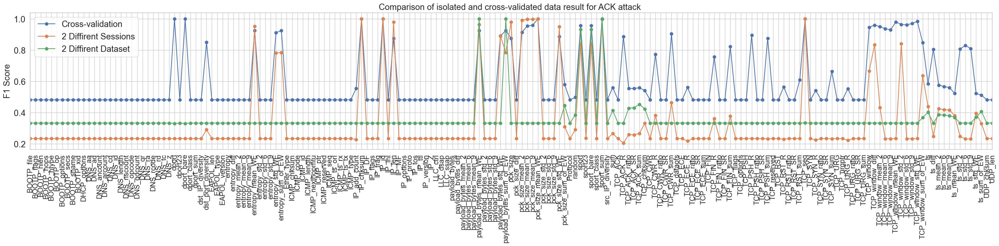

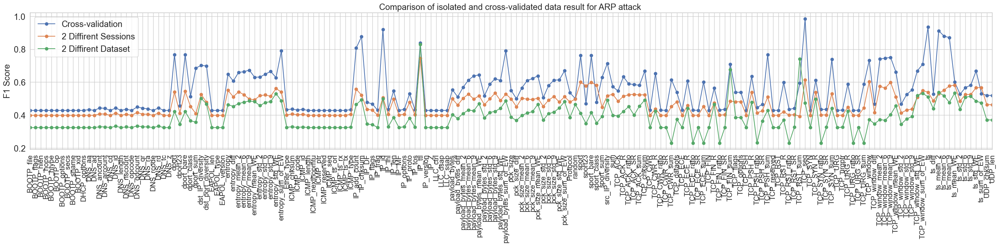

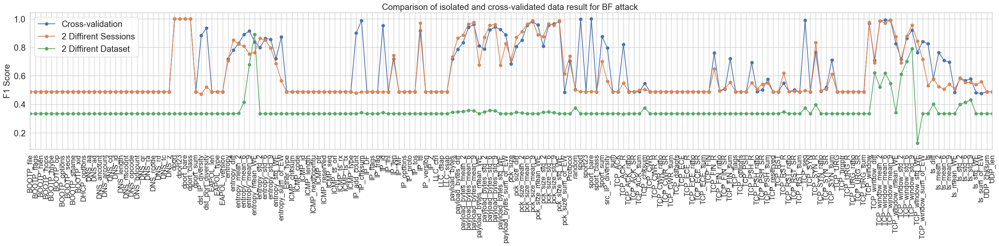

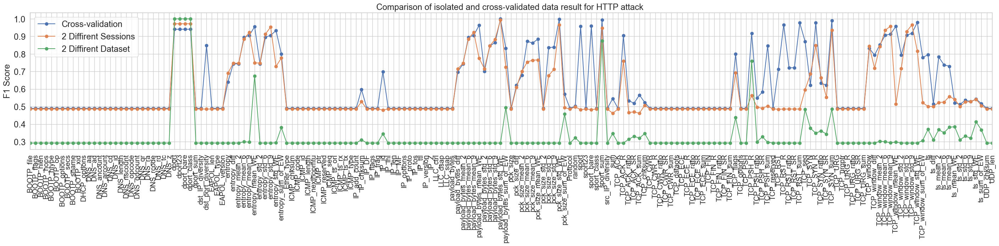

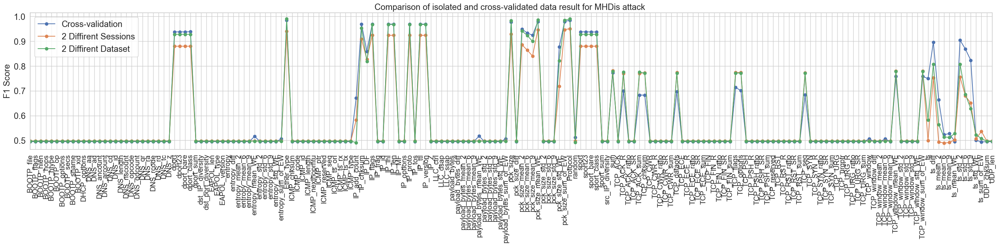

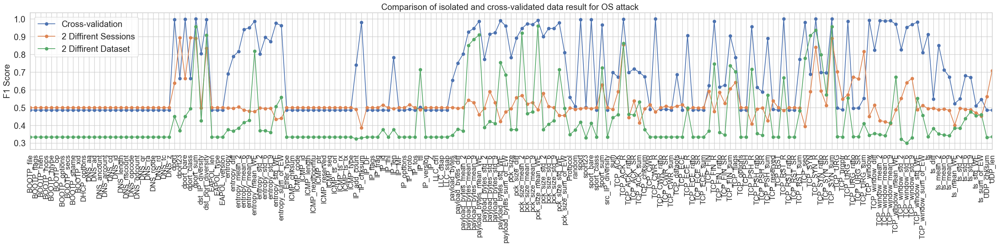

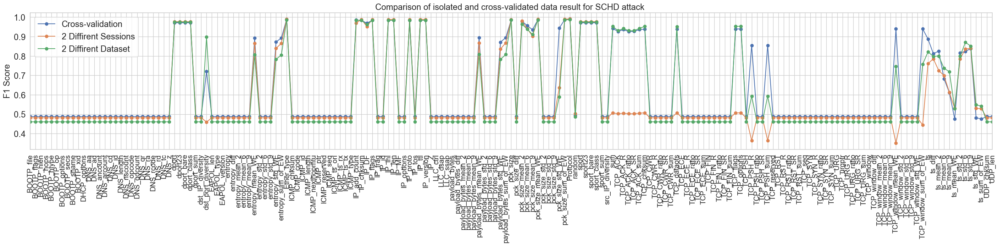

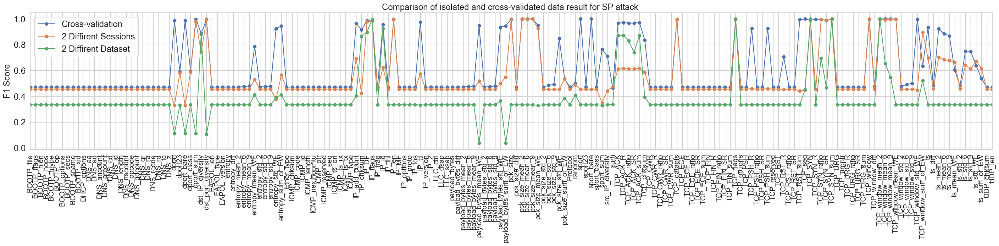

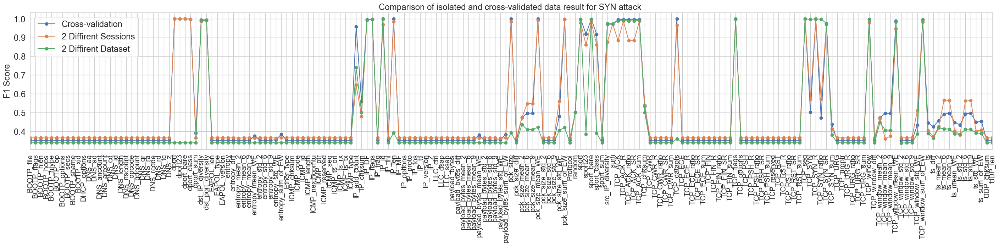

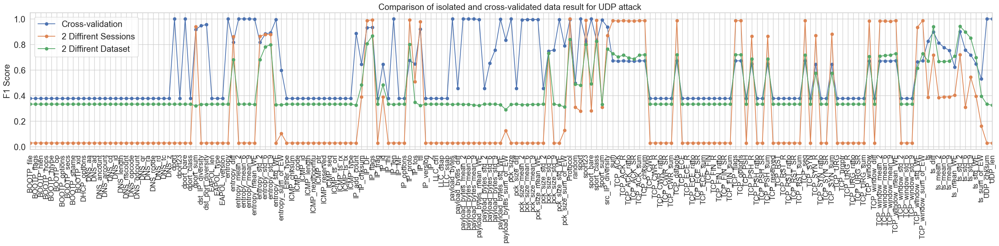

In [29]:
method={"CV":"Cross-validation","SS":"2 Diffirent Sessions","DD":"2 Diffirent Dataset" }
import matplotlib.pylab as pylab
sns.set_style("whitegrid")
params = {'legend.fontsize': 'x-large',
          'figure.figsize': (35, 5),
         'axes.labelsize': 'x-large',
         'axes.titlesize':'x-large',
         'xtick.labelsize':'large',
         'ytick.labelsize':'x-large'}
for i in results["Feature"].unique():    
    graph_name=f"./pdfs/Comparison_f1_{i}.pdf"
    plt.margins(x=0)
    
    df=results[results["Feature"]==i]
    for ii in results["Folder"].unique():
        sf=df[df["Folder"]==ii]
        my_xticks=sf["Attack"]#list(iso.index)
        pylab.rcParams.update(params)
        #plt.figure(figsize=(10,10))
        #plt.plot(my_xticks,iso['Acc'], linestyle='--', marker='.', color='b',label= "Separate Train & Test acc")
        #plt.plot(my_xticks,cv['Acc'], linestyle='--', marker='.', color='r',label= "10-Fold CV acc")
        plt.plot(my_xticks,sf['F1'], linestyle='-', marker='o',label= method[ii])
    #plt.plot(my_xticks,iso[' F1-score'], linestyle='-', marker='o', color='m',label= "Diffirent Dataset Isolated")
    #plt.plot(my_xticks,cv[' F1-score'], linestyle='-', marker='o', color='b',label= "5-Fold CV")
    #plt.axhline(0.492885, color='r',label= "Primary feature list")
    #plt.axhline(0.443367, color='r',label= "Primary feature list")
    plt.title(f"Comparison of isolated and cross-validated data result for {i} attack ")
    plt.legend(numpoints=1)
    #plt.legend(bbox_to_anchor=(1.04,1), loc="upper left")
    plt.ylabel("F1 Score")
    plt.xticks(rotation=90) 
    #plt.ylim([0.69, 0.71]) 
    plt.savefig(graph_name,bbox_inches='tight',format="pdf")#, dpi=400)
    plt.show()
        
    

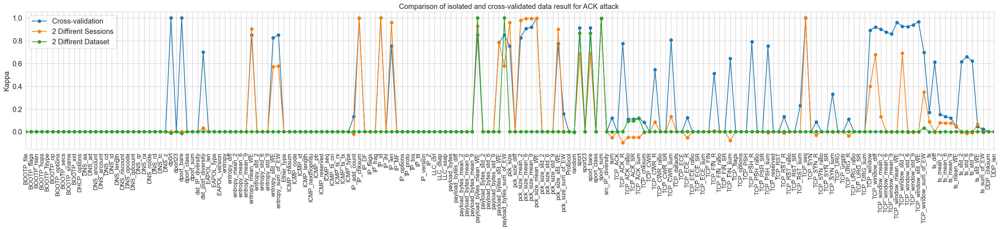

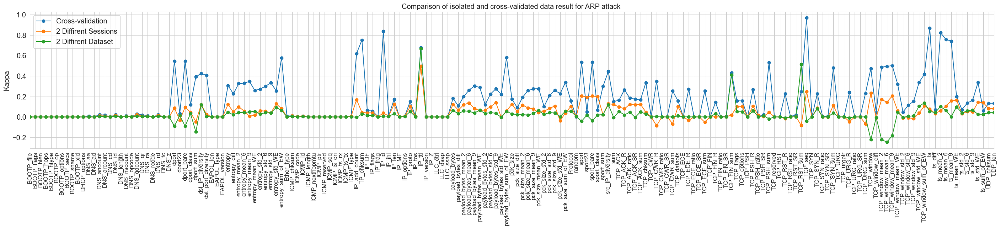

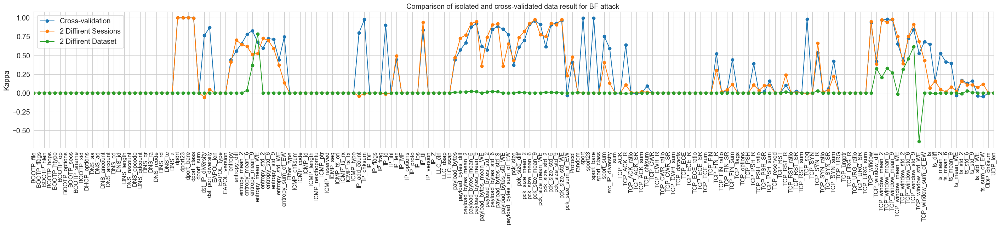

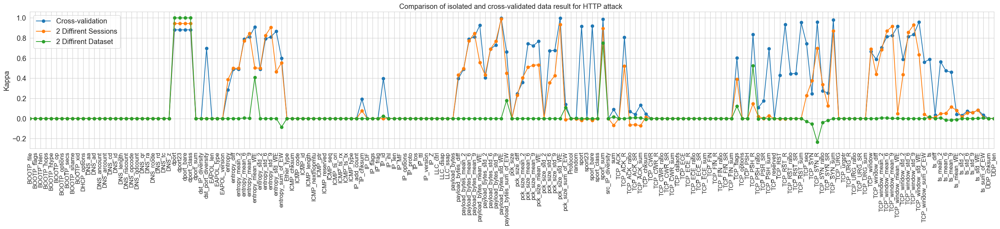

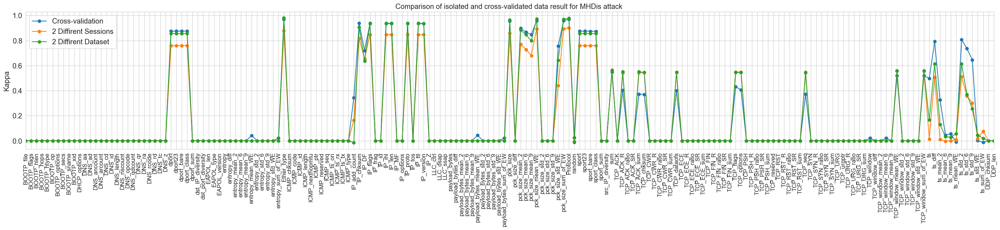

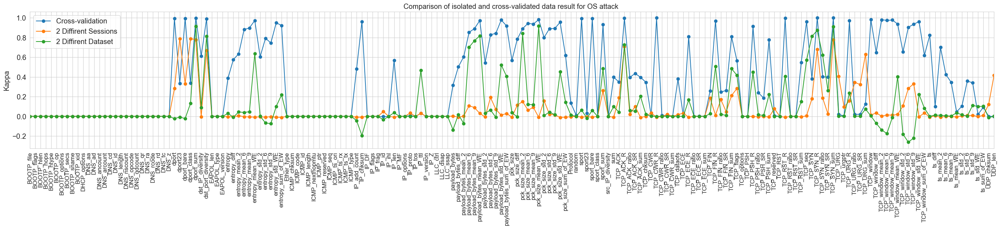

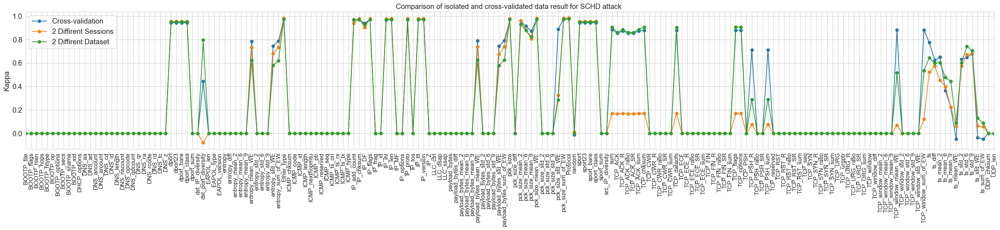

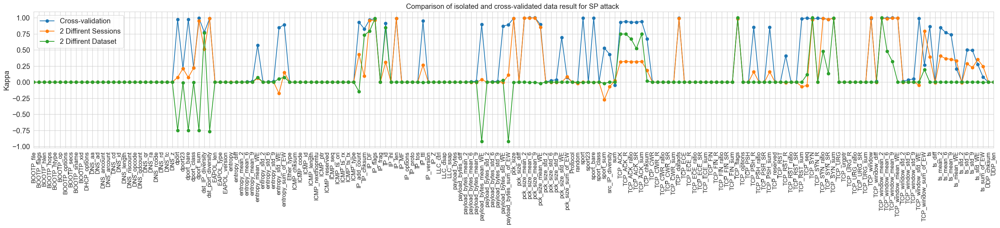

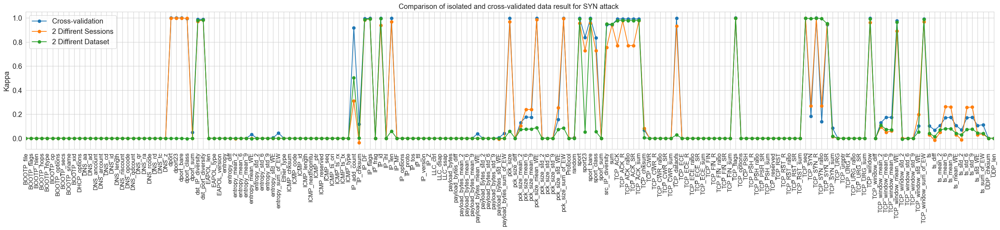

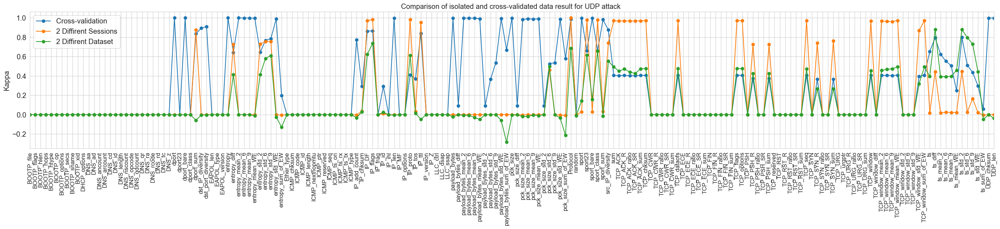

In [23]:
method={"CV":"Cross-validation","SS":"2 Diffirent Sessions","DD":"2 Diffirent Dataset" }
import matplotlib.pylab as pylab
sns.set_style("whitegrid")
params = {'legend.fontsize': 'x-large',
          'figure.figsize': (35, 5),
         'axes.labelsize': 'x-large',
         'axes.titlesize':'x-large',
         'xtick.labelsize':'large',
         'ytick.labelsize':'x-large'}
for i in results["Feature"].unique():    
    graph_name=f"./pdfs/Comparison_kappa_{i}.pdf"
    plt.margins(x=0)
    temp=[]
    df=results[results["Feature"]==i]
    for ii in results["Folder"].unique():
        sf=df[df["Folder"]==ii]
        my_xticks=sf["Attack"]#list(iso.index)
        pylab.rcParams.update(params)
        temp.append(sf['kap'].values)
        #plt.figure(figsize=(10,10))
        #plt.plot(my_xticks,iso['Acc'], linestyle='--', marker='.', color='b',label= "Separate Train & Test acc")
        #plt.plot(my_xticks,cv['Acc'], linestyle='--', marker='.', color='r',label= "10-Fold CV acc")
        plt.plot(my_xticks,sf['kap'], linestyle='-', marker='o',label= method[ii])
    #plt.plot(my_xticks,iso[' F1-score'], linestyle='-', marker='o', color='m',label= "Diffirent Dataset Isolated")
    #plt.plot(my_xticks,cv[' F1-score'], linestyle='-', marker='o', color='b',label= "5-Fold CV")
    #plt.axhline(0.492885, color='r',label= "Primary feature list")
    #plt.axhline(0.443367, color='r',label= "Primary feature list")
    plt.title(f"Comparison of isolated and cross-validated data result for {i} attack ")
    plt.legend(numpoints=1)
    #plt.legend(bbox_to_anchor=(1.04,1), loc="upper left")
    plt.ylabel("Kappa")
    plt.xticks(rotation=90) 
    #plt.ylim([0.69, 0.71]) 
    plt.savefig(graph_name,bbox_inches='tight',format="pdf")#, dpi=400)
    plt.show()
    

In [24]:
IDF=['DNS_id',
     'TCP_seq','Ether_dst','ICMP_chksum',
'ICMP_id',"IP_len",  
"pck_size",
'ICMP_seq',"UDP_chksum",
'ICMP_unused',
'ID',
'IP_chksum',
'IP_dst',
"random",'src_IP_diversity',
'IP_id',
'IP_src','TCP_ack','TCP_chksum','sport_bare','dport_bare',
'dport23','sport23','dport',
'sport']
     
     
     

# 'sum',
#'TCP_ACK_sum',
#'TCP_CWR_sum',
#'TCP_ECE_sum',
#'TCP_FIN_sum',
#'TCP_PSH_sum',
#'TCP_RST_sum',
#'TCP_SYN_sum',
#'TCP_URG_sum',
#'UDP_chksum']

In [25]:
GA_input={}

____________________________________ACK________________________________________________________
65
['dport', 'dport_bare', 'dst_port_diversity', 'entropy_mean_WE', 'entropy_std_WE', 'entropy_sum_of_EW', 'IP_add_count', 'IP_chksum', 'IP_id', 'IP_len', 'payload_bytes_mean_WE', 'payload_bytes_std_WE', 'payload_bytes_sum_of_EW', 'pck_size', 'pck_size_mean_2', 'pck_size_mean_6', 'pck_size_mean_9', 'pck_size_mean_WE', 'pck_size_std_WE', 'pck_size_sum_of_EW', 'sport', 'sport_bare', 'sport_sum', 'sum', 'TCP_ACK_R', 'TCP_ACK_ratio', 'TCP_ACK_SR', 'TCP_ACK_sum', 'TCP_chksum', 'TCP_CWR_R', 'TCP_CWR_sum', 'TCP_ECE_R', 'TCP_FIN_R', 'TCP_FIN_sum', 'TCP_PSH_R', 'TCP_PSH_sum', 'TCP_RST_R', 'TCP_RST_sum', 'TCP_seq', 'TCP_SYN_R', 'TCP_SYN_sum', 'TCP_URG_R', 'TCP_window', 'TCP_window_diff', 'TCP_window_mean_2', 'TCP_window_mean_6', 'TCP_window_mean_9', 'TCP_window_mean_WE', 'TCP_window_std_2', 'TCP_window_std_6', 'TCP_window_std_9', 'TCP_window_std_WE', 'TCP_window_sum_of_EW', 'ts', 'ts_diff', 'ts_mean_2

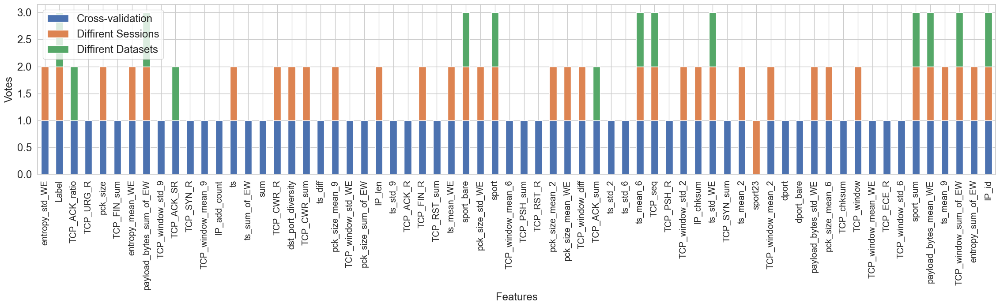

____________________________________ARP________________________________________________________
145
['DNS_aa', 'DNS_ancount', 'DNS_arcount', 'DNS_id', 'DNS_nscount', 'DNS_qdcount', 'DNS_qr', 'DNS_ra', 'DNS_rd', 'dport', 'dport23', 'dport_bare', 'dport_class', 'dport_sum', 'dst_IP_diversity', 'dst_port_diversity', 'entropy', 'entropy_diff', 'entropy_mean_2', 'entropy_mean_6', 'entropy_mean_9', 'entropy_mean_WE', 'entropy_std_2', 'entropy_std_6', 'entropy_std_9', 'entropy_std_WE', 'entropy_sum_of_EW', 'Ether_type', 'ICMP_chksum', 'ICMP_code', 'ICMP_id', 'ICMP_type', 'IP_add_count', 'IP_chksum', 'IP_DF', 'IP_flags', 'IP_frag', 'IP_id', 'IP_ihl', 'IP_len', 'IP_MF', 'IP_options', 'IP_proto', 'IP_tos', 'IP_ttl', 'IP_version', 'payload_bytes', 'payload_bytes_diff', 'payload_bytes_mean_2', 'payload_bytes_mean_6', 'payload_bytes_mean_9', 'payload_bytes_mean_WE', 'payload_bytes_std_2', 'payload_bytes_std_6', 'payload_bytes_std_9', 'payload_bytes_std_WE', 'payload_bytes_sum_of_EW', 'pck_size', 'p

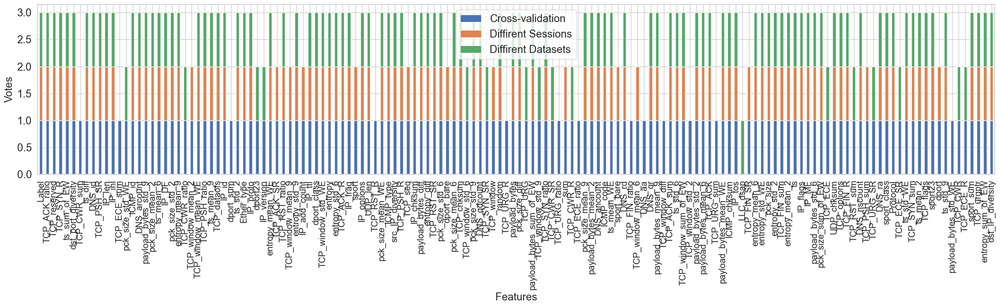

____________________________________BF________________________________________________________
86
['dport', 'dport23', 'dport_bare', 'dport_class', 'dst_IP_diversity', 'dst_port_diversity', 'entropy', 'entropy_diff', 'entropy_mean_2', 'entropy_mean_6', 'entropy_mean_9', 'entropy_mean_WE', 'entropy_std_2', 'entropy_std_6', 'entropy_std_9', 'entropy_std_WE', 'entropy_sum_of_EW', 'IP_add_count', 'IP_chksum', 'IP_id', 'IP_len', 'IP_ttl', 'payload_bytes', 'payload_bytes_diff', 'payload_bytes_mean_2', 'payload_bytes_mean_6', 'payload_bytes_mean_9', 'payload_bytes_mean_WE', 'payload_bytes_std_2', 'payload_bytes_std_6', 'payload_bytes_std_9', 'payload_bytes_std_WE', 'payload_bytes_sum_of_EW', 'pck_size', 'pck_size_diff', 'pck_size_mean_2', 'pck_size_mean_6', 'pck_size_mean_9', 'pck_size_mean_WE', 'pck_size_std_2', 'pck_size_std_6', 'pck_size_std_9', 'pck_size_std_WE', 'Protocol', 'random', 'sport', 'sport_bare', 'sport_sum', 'src_IP_diversity', 'TCP_ACK_R', 'TCP_chksum', 'TCP_FIN_R', 'TCP_FIN_

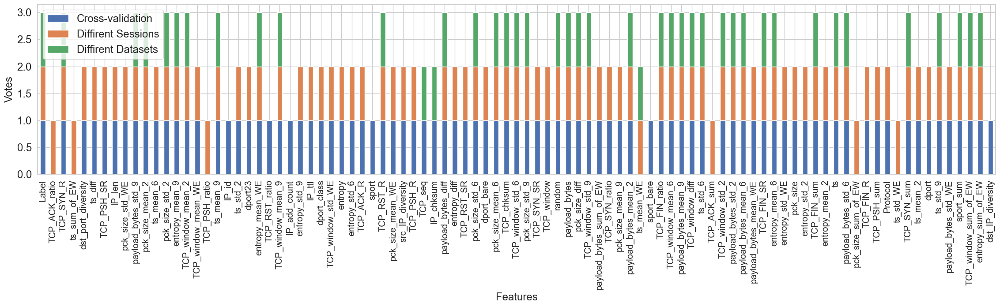

____________________________________HTTP________________________________________________________
86
['dport', 'dport23', 'dport_bare', 'dport_class', 'dst_port_diversity', 'entropy', 'entropy_diff', 'entropy_mean_2', 'entropy_mean_6', 'entropy_mean_9', 'entropy_mean_WE', 'entropy_std_2', 'entropy_std_6', 'entropy_std_9', 'entropy_std_WE', 'entropy_sum_of_EW', 'IP_chksum', 'IP_id', 'payload_bytes_diff', 'payload_bytes_mean_2', 'payload_bytes_mean_6', 'payload_bytes_mean_9', 'payload_bytes_mean_WE', 'payload_bytes_std_2', 'payload_bytes_std_6', 'payload_bytes_std_9', 'payload_bytes_std_WE', 'payload_bytes_sum_of_EW', 'pck_size_diff', 'pck_size_mean_2', 'pck_size_mean_6', 'pck_size_mean_9', 'pck_size_mean_WE', 'pck_size_std_6', 'pck_size_std_9', 'pck_size_std_WE', 'pck_size_sum_of_EW', 'random', 'sport', 'sport_bare', 'sport_sum', 'sum', 'TCP_ACK_R', 'TCP_ACK_ratio', 'TCP_ACK_SR', 'TCP_ACK_sum', 'TCP_chksum', 'TCP_flags', 'TCP_PSH_R', 'TCP_PSH_ratio', 'TCP_PSH_SR', 'TCP_PSH_sum', 'TCP_RST

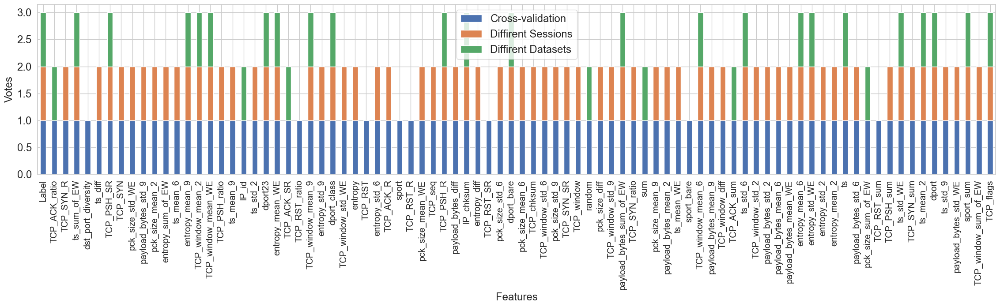

____________________________________MHDis________________________________________________________
53
['dport', 'dport23', 'dport_bare', 'dport_class', 'entropy_mean_WE', 'entropy_sum_of_EW', 'Ether_type', 'IP_add_count', 'IP_chksum', 'IP_DF', 'IP_flags', 'IP_ihl', 'IP_len', 'IP_proto', 'IP_ttl', 'IP_version', 'payload_bytes_mean_WE', 'payload_bytes_sum_of_EW', 'pck_size', 'pck_size_mean_2', 'pck_size_mean_6', 'pck_size_mean_9', 'pck_size_mean_WE', 'pck_size_std_WE', 'pck_size_sum_of_EW', 'Protocol', 'random', 'sport', 'sport23', 'sport_bare', 'sport_class', 'sum', 'TCP_ACK_R', 'TCP_ACK_sum', 'TCP_chksum', 'TCP_dataofs', 'TCP_flags', 'TCP_options', 'TCP_seq', 'TCP_window', 'TCP_window_mean_6', 'TCP_window_mean_WE', 'TCP_window_sum_of_EW', 'ts', 'ts_diff', 'ts_mean_2', 'ts_mean_6', 'ts_mean_9', 'ts_std_2', 'ts_std_6', 'ts_std_9', 'ts_std_WE', 'Label']


47
['dport', 'dport23', 'dport_bare', 'dport_class', 'Ether_type', 'IP_add_count', 'IP_chksum', 'IP_DF', 'IP_flags', 'IP_ihl', 'IP_len',

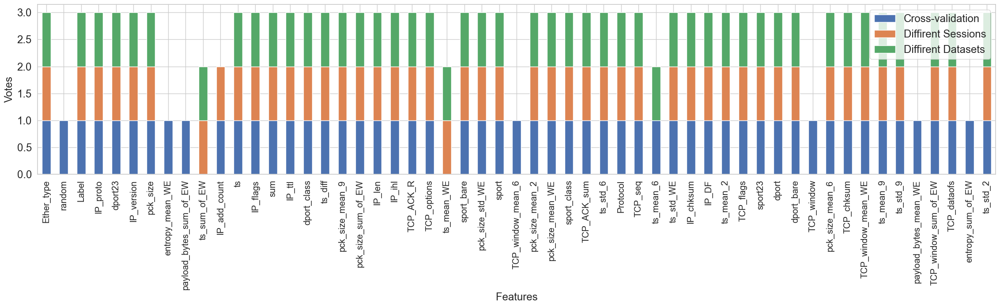

____________________________________OS________________________________________________________
115
['dport', 'dport23', 'dport_bare', 'dport_class', 'dport_sum', 'dst_IP_diversity', 'dst_port_diversity', 'entropy', 'entropy_diff', 'entropy_mean_2', 'entropy_mean_6', 'entropy_mean_9', 'entropy_mean_WE', 'entropy_std_2', 'entropy_std_6', 'entropy_std_9', 'entropy_std_WE', 'entropy_sum_of_EW', 'IP_add_count', 'IP_chksum', 'IP_len', 'IP_proto', 'IP_ttl', 'payload_bytes', 'payload_bytes_diff', 'payload_bytes_mean_2', 'payload_bytes_mean_6', 'payload_bytes_mean_9', 'payload_bytes_mean_WE', 'payload_bytes_std_2', 'payload_bytes_std_6', 'payload_bytes_std_9', 'payload_bytes_std_WE', 'payload_bytes_sum_of_EW', 'pck_size', 'pck_size_diff', 'pck_size_mean_2', 'pck_size_mean_6', 'pck_size_mean_9', 'pck_size_mean_WE', 'pck_size_std_2', 'pck_size_std_6', 'pck_size_std_9', 'pck_size_std_WE', 'pck_size_sum_of_EW', 'Protocol', 'random', 'sport', 'sport23', 'sport_bare', 'sport_sum', 'sum', 'TCP_ACK', '

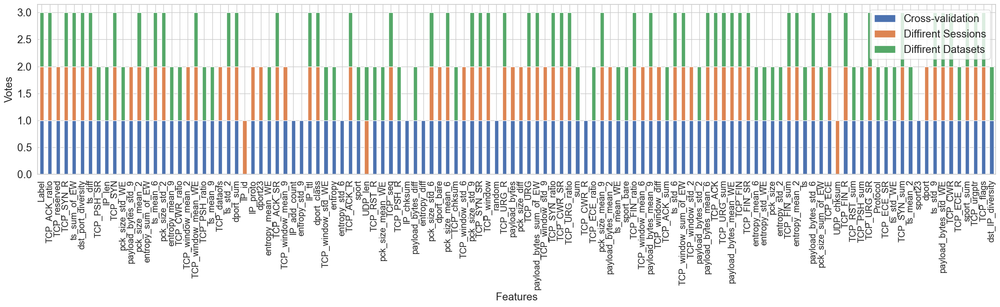

____________________________________SCHD________________________________________________________
56
['dport', 'dport23', 'dport_bare', 'dport_class', 'dst_port_diversity', 'entropy_mean_WE', 'entropy_std_WE', 'entropy_sum_of_EW', 'Ether_type', 'IP_add_count', 'IP_chksum', 'IP_DF', 'IP_flags', 'IP_ihl', 'IP_len', 'IP_proto', 'IP_ttl', 'IP_version', 'payload_bytes_mean_WE', 'payload_bytes_std_WE', 'payload_bytes_sum_of_EW', 'pck_size', 'pck_size_mean_2', 'pck_size_mean_6', 'pck_size_mean_9', 'pck_size_mean_WE', 'pck_size_std_WE', 'pck_size_sum_of_EW', 'Protocol', 'sport', 'sport23', 'sport_bare', 'sport_class', 'sum', 'TCP_ACK', 'TCP_ACK_R', 'TCP_ACK_ratio', 'TCP_ACK_SR', 'TCP_ACK_sum', 'TCP_chksum', 'TCP_dataofs', 'TCP_flags', 'TCP_options', 'TCP_PSH_R', 'TCP_PSH_sum', 'TCP_window_mean_WE', 'TCP_window_sum_of_EW', 'ts', 'ts_diff', 'ts_mean_2', 'ts_mean_6', 'ts_mean_9', 'ts_std_2', 'ts_std_6', 'ts_std_9', 'Label']


59
['dport', 'dport23', 'dport_bare', 'dport_class', 'entropy_mean_WE', 

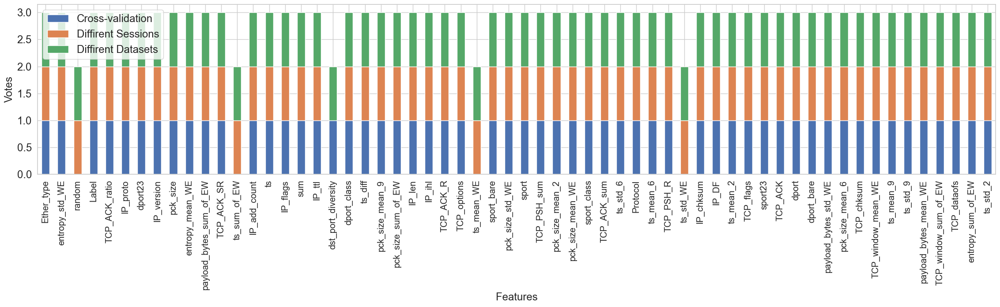

____________________________________SP________________________________________________________
84
['dport', 'dport23', 'dport_bare', 'dport_class', 'dport_sum', 'dst_IP_diversity', 'dst_port_diversity', 'entropy_mean_6', 'entropy_mean_9', 'entropy_mean_WE', 'entropy_std_6', 'entropy_std_9', 'entropy_std_WE', 'entropy_sum_of_EW', 'IP_add_count', 'IP_chksum', 'IP_DF', 'IP_flags', 'IP_id', 'IP_len', 'IP_ttl', 'payload_bytes_mean_2', 'payload_bytes_mean_6', 'payload_bytes_mean_9', 'payload_bytes_mean_WE', 'payload_bytes_std_6', 'payload_bytes_std_9', 'payload_bytes_std_WE', 'payload_bytes_sum_of_EW', 'pck_size', 'pck_size_mean_2', 'pck_size_mean_6', 'pck_size_mean_9', 'pck_size_mean_WE', 'pck_size_std_2', 'pck_size_std_6', 'pck_size_std_9', 'pck_size_std_WE', 'pck_size_sum_of_EW', 'sport', 'sport_bare', 'sport_sum', 'src_IP_diversity', 'TCP_ACK', 'TCP_ACK_R', 'TCP_ACK_ratio', 'TCP_ACK_SR', 'TCP_ACK_sum', 'TCP_chksum', 'TCP_dataofs', 'TCP_flags', 'TCP_PSH_R', 'TCP_PSH_sum', 'TCP_RST_R', 'TC

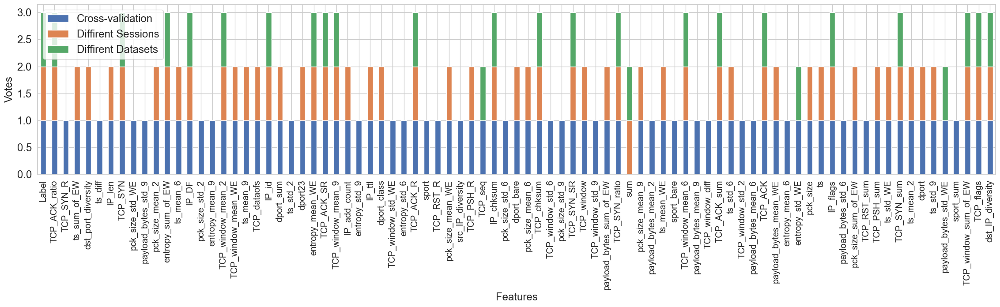

____________________________________SYN________________________________________________________
68
['dport', 'dport23', 'dport_bare', 'dport_class', 'dport_sum', 'dst_IP_diversity', 'dst_port_diversity', 'entropy_mean_WE', 'entropy_std_WE', 'entropy_sum_of_EW', 'IP_add_count', 'IP_chksum', 'IP_DF', 'IP_flags', 'IP_id', 'IP_len', 'payload_bytes_mean_WE', 'payload_bytes_std_WE', 'payload_bytes_sum_of_EW', 'pck_size', 'pck_size_mean_2', 'pck_size_mean_6', 'pck_size_mean_9', 'pck_size_mean_WE', 'pck_size_std_WE', 'pck_size_sum_of_EW', 'random', 'sport', 'sport23', 'sport_bare', 'sport_class', 'src_IP_diversity', 'sum', 'TCP_ACK', 'TCP_ACK_R', 'TCP_ACK_ratio', 'TCP_ACK_SR', 'TCP_ACK_sum', 'TCP_chksum', 'TCP_dataofs', 'TCP_flags', 'TCP_seq', 'TCP_SYN', 'TCP_SYN_R', 'TCP_SYN_ratio', 'TCP_SYN_SR', 'TCP_SYN_sum', 'TCP_urgptr', 'TCP_window', 'TCP_window_mean_2', 'TCP_window_mean_6', 'TCP_window_mean_9', 'TCP_window_mean_WE', 'TCP_window_std_2', 'TCP_window_std_WE', 'TCP_window_sum_of_EW', 'ts', 

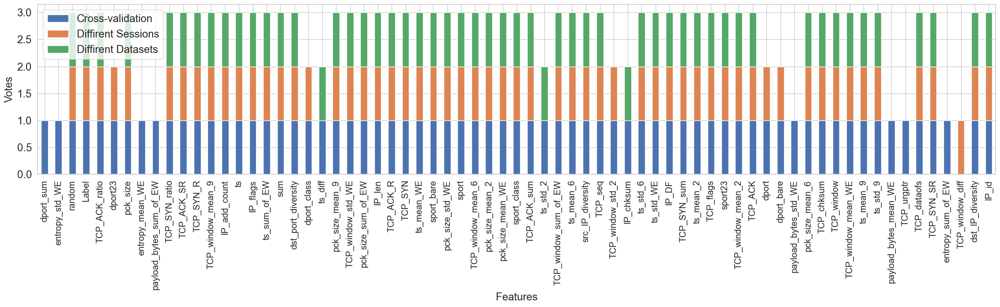

____________________________________UDP________________________________________________________
90
['dport', 'dport_bare', 'dport_sum', 'dst_IP_diversity', 'dst_port_diversity', 'entropy', 'entropy_diff', 'entropy_mean_2', 'entropy_mean_6', 'entropy_mean_9', 'entropy_mean_WE', 'entropy_std_2', 'entropy_std_6', 'entropy_std_9', 'entropy_std_WE', 'entropy_sum_of_EW', 'IP_add_count', 'IP_chksum', 'IP_DF', 'IP_flags', 'IP_id', 'IP_len', 'IP_proto', 'IP_tos', 'IP_ttl', 'payload_bytes', 'payload_bytes_diff', 'payload_bytes_mean_2', 'payload_bytes_mean_6', 'payload_bytes_mean_9', 'payload_bytes_mean_WE', 'payload_bytes_std_2', 'payload_bytes_std_6', 'payload_bytes_std_9', 'payload_bytes_std_WE', 'payload_bytes_sum_of_EW', 'pck_size', 'pck_size_diff', 'pck_size_mean_2', 'pck_size_mean_6', 'pck_size_mean_9', 'pck_size_mean_WE', 'pck_size_std_2', 'pck_size_std_6', 'pck_size_std_9', 'pck_size_std_WE', 'pck_size_sum_of_EW', 'Protocol', 'sport', 'sport23', 'sport_bare', 'sport_class', 'sport_sum', 

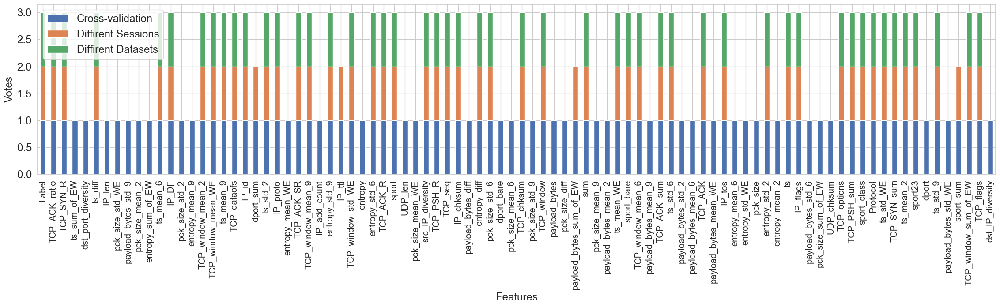

In [26]:
method={"CV":"Cross-validation","SS":"2 Diffirent Sessions","DD":"2 Diffirent Dataset" }
import matplotlib.pylab as pylab
for attack in results["Feature"].unique():
    print(f"____________________________________{attack}________________________________________________________")
    #plt.margins(x=0)
    temp=[]
    df=results[results["Feature"]==attack]
    for ii in results["Folder"].unique():
        sf=df[df["Folder"]==ii]
        my_xticks=sf["Attack"]#list(iso.index)
        temp.append(sf['kap'].values)   
    itself=[]
    same=[]
    diff=[]
    my_xticks=my_xticks.values
    flag=1
    for j in range(len(temp[0])):
        if temp[0][j]>0:
            itself.append(my_xticks[j])
        if temp[1][j]>0:
            same.append(my_xticks[j])
        if temp[2][j]>0:
            diff.append(my_xticks[j])
    itself.append("Label")
    same.append("Label")
    diff.append("Label")
        
    for j in [itself,same]:
        print(len(j))
        print(f"{j}\n\n")
        
        
    merged=itself+same
    final_list=[]
    for d in diff:
        if d in merged:
            final_list.append(d)
            
        
        
        
        
        
    c1 = Counter(final_list)
    c2 = Counter(IDF)
    final_list = list((c1 - c2).elements())
    print(len(final_list))
    print(f"{final_list}\n\n")
    main=itself+same+diff

    GA_input[attack]=final_list
    main=set(main)
    mainlist=[]
    for i in main:
        temp=[i,int(i in itself),int(i in same),int(i in diff)]
        mainlist.append(temp)
    data=pd.DataFrame(mainlist, columns=["Feature", "Cross-validation","Diffirent Sessions","Diffirent Datasets"]).set_index('Feature')
    graph_name=f"./pdfs/kappa_{attack}_Voting2.PDF"
    import seaborn as sns
    sns.set_theme(style="whitegrid")

    plt.rcParams.update(params)
    import matplotlib.pylab as pylab

    #pylab.rcParams.update(params)

    data.plot.bar(stacked=True,figsize=(28,5))
    plt.xlabel('Features')
    plt.ylabel('Votes')
    plt.savefig(graph_name,bbox_inches='tight',format="pdf")#, dpi=400)
    plt.show()
    

In [27]:
import json
with open('GA_input.json', 'w') as fp:
    json.dump(GA_input, fp)

In [28]:
GA_input

{'ACK': ['payload_bytes_mean_WE',
  'payload_bytes_sum_of_EW',
  'sport_sum',
  'TCP_ACK_ratio',
  'TCP_ACK_SR',
  'TCP_ACK_sum',
  'TCP_window_sum_of_EW',
  'ts_mean_6',
  'ts_std_WE',
  'Label'],
 'ARP': ['DNS_ancount',
  'DNS_arcount',
  'DNS_nscount',
  'DNS_qdcount',
  'DNS_qr',
  'DNS_ra',
  'DNS_rd',
  'dport_class',
  'dst_IP_diversity',
  'dst_port_diversity',
  'entropy',
  'entropy_diff',
  'entropy_mean_2',
  'entropy_mean_6',
  'entropy_mean_9',
  'entropy_mean_WE',
  'entropy_std_2',
  'entropy_std_6',
  'entropy_std_9',
  'entropy_std_WE',
  'entropy_sum_of_EW',
  'Ether_type',
  'ICMP_code',
  'ICMP_type',
  'IP_DF',
  'IP_flags',
  'IP_frag',
  'IP_ihl',
  'IP_MF',
  'IP_options',
  'IP_proto',
  'IP_tos',
  'IP_ttl',
  'IP_version',
  'payload_bytes',
  'payload_bytes_diff',
  'payload_bytes_mean_2',
  'payload_bytes_mean_6',
  'payload_bytes_mean_9',
  'payload_bytes_mean_WE',
  'payload_bytes_std_2',
  'payload_bytes_std_6',
  'payload_bytes_std_9',
  'payload_bytes